In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import dataset
import preprocessing
import os

C:\Users\line\Desktop\Mauro\2_Preprocessing_Code\amd\prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem


In [3]:
from tqdm import tqdm
%matplotlib inline 
import matplotlib.pyplot as plt

The config files are containing the data to build some dictionaries, in particular they are three files in the config folder:
* dataset.txt: this file contains the path to the raw_dataset and also some specifications regarding the use of different images
* output.txt: contains the path of the output files (location to write results)
* parameters.txt: contains two paths, the first one to filename_to_meta_mapping_extended_and_restored and the second one to the segmented octs. In addition it contains some parameters of the preprocessing operations.
All this files are used to build config dictionaries.

In [4]:
#root_config = '/chuvdatarc/ja8818/RAD/LINE/Benedetta_Franceschiello/5_OCTs_Jakub_Gwizdala/1_OCT_Dataset/2_Preprocessing_Code/config'
root_config = 'C:\\Users\\line\\Desktop\\Mauro\\2_Preprocessing_Code\\config'
dataset_config = os.path.join(root_config, 'dataset.txt')
output_config = os.path.join(root_config, 'output.txt')
parameters_config = os.path.join(root_config, 'parameters.txt')

The init below is creating a global variable DATASET storing a dictionary in the dataset file: 
this dict contains ((rootPath->),(dataPath->),(amd->),(control->),(amdExclude->),(controlExclude->),(amdTrain->),(amdTest->),(controlTrain->),(controlTest->))

In [5]:
print('Initializing dataset')
_ = dataset.initialize(dataset_config)

Initializing dataset


In the next cell we build some config ditionaries and some Identifiers:

* output_folders: ((labels->),(coregistration->),(homography->),(warped_labels->),(labelled_octs->),(preprocessed_octs->),(stripe_dataset->)) contains the paths of output folders
* parameters: ((mapping -> (?filename to meta mapping? path) ),(meta -> OCTsegmented path),(settigs params ->))


The EyeIdentifier class is used to identify uniquely  (1 to 1) an eye, thanks to the set of variables (eye, group, subject_id)
group ('amd' or 'control'), eye ('left' or 'right'), id is an integer

* eye_identifiers: A list containing all the possible EyeIdentifiers in the dataset (will be used to iterate the dataset???)

The PartIdentifier class is used to identify uniquely  (1 to 1) a part, thanks to the set of variables (eye, group, subject_id,part)
part is necessary to identify which part of the eye fundus this volume represents. If it comes from a 'dense' scan the only
part can be 'full'. If it comes from a 'detail' scan it can be either 'up', 'center' or 'down' and represent a respective part of the eye fundus.
* part_identifiers: A list containing all the possible PartIdentifiers in the dataset (will be used to iterate the dataset???)

In [6]:
print('Parsing preprocessing config')
output_folders = preprocessing.parse_config_file(output_config)
parameters = preprocessing.parse_config_file(parameters_config)
eye_identifiers = preprocessing.all_eye_identifiers()
part_identifiers = preprocessing.all_part_identifiers()

Parsing preprocessing config


In [7]:
print('group: ',eye_identifiers[2][0],'subj id: ',
eye_identifiers[2][1],'eye: ',
eye_identifiers[2][2])

group:  amd subj id:  2 eye:  left


In [8]:
# :param group: subject's group ('amd' or 'control')
# :param subject_id: subject's id (integers starting from 0 within the group)
# :param eye: subject's eye ('left' or 'right')
# :param part:


part_identifiers[0]
print('group: ',part_identifiers[0][0],'subj id: ',
part_identifiers[0][1],'eye: ',
part_identifiers[0][2],'part: ',part_identifiers[0][3])

group:  amd subj id:  0 eye:  left part:  full


## Preprocessing steps
* segmentation -> create binary mask fixation/not fixation using the eyeidentifiers list, and some config info 
To compute the BCEA ellipse the functions subcalls are using cv2 library to extract the bcea regions. Once the BCEA is calculated the results are saved in the output folder, in the format (output_folder, identifier, label {indicates whether the inner or outer ellipse is used}) 

In [9]:
print('Extracting labels from BCEA images')
preprocessing.create_labels(eye_identifiers, output_folders['labels'], ellipse=parameters['ellipse'])

Extracting labels from BCEA images


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:03<00:00, 10.44it/s]


* compute the parameters of the trasformation to map maia fundus with OCTs fundus. to do it we Fist compute the keypoints of the two fundus and then apply a matching strategy. all this is done by subcalls to registration.py functions that are built on top of the cv2 library.
The results are saved in two pickle files in the following format:

save_pickle(coregistration_data_output_folder, identifier, coregistration_data)
save_pickle(homography_transform_output_folder, identifier, homography_transform)

In addition a subset of identifiers is returned. 

In [10]:
print('Registering Spectralis and MAIA fundus images')
part_identifiers = preprocessing.compute_coregistration_parameters(
    part_identifiers, output_folders['coregistration'], output_folders['homography']
)

Registering Spectralis and MAIA fundus images


100%|████████████████████████████████████████████████████████████████████████████████| 160/160 [01:56<00:00,  1.38it/s]


Filter in order to keep only good matching pairs, and avoid to introduce errors in the dataset.Straight forward computation of if similarity is superior to a given minimal coregistration required.

In [11]:
print('Filtering data based on registration SSIM quality')
part_identifiers = preprocessing.filter_identifiers_based_on_coregistration_ssim_measure(
    part_identifiers, output_folders['coregistration'],
    float(parameters['ssim_threshold']), float(parameters['ssim_window_size_fraction'])
)

Filtering data based on registration SSIM quality


100%|████████████████████████████████████████████████████████████████████████████████| 133/133 [01:42<00:00,  1.29it/s]


Apply warping to the labels (binary masks). The warped immages are saved in the output folder in the following format save_npy(output_folder, identifier, warped_label)

In [12]:
print('Warping labels')
part_identifiers = preprocessing.create_warped_labels(
    part_identifiers, output_folders['labels'], output_folders['coregistration'],
    output_folders['homography'], output_folders['warped_labels']
)

Warping labels


100%|████████████████████████████████████████████████████████████████████████████████| 125/125 [00:32<00:00,  3.80it/s]


Here we combine the OCT scans and the labels. FIrst we create some VolumeIdentifiers. VolumeIdentifiers is a class used to Identify used OCT volumes for one subject's eye thanks to the set of parameters (group,subject_id,eye,volume_type
type of the OCT volumes used: 'dense' - single OCT volume per eye with 49 B-scans covering 20x20 visual angles; 'detail' - up to 3 OCT volumes per eye ('up', 'center', 'down'), each covering 15x5 visual angles with 49 B-scans. For the OCT volumes details, e.g. visual angle coverage and number of B-scans check the Spectralis manual (those above were from the top of my head). :param parts: names for all the actual OCT volumes used for this eye (see PartIdentifier). In case of 'dense' OCT volume there is only one part - 'full'. For 'detail' volumes there is up to 3 parts: 'up', 'center' and 'down'.
Then we pair the octs with the warped labels

In [13]:
print('Combining OCT scans with labels')
volume_identifiers = preprocessing.get_volume_identifiers(part_identifiers)

Combining OCT scans with labels


In [14]:
volume_identifiers

In [15]:
print('volumeType : ',volume_identifiers[0].volume_type)
print('volumeParts : ',volume_identifiers[0].parts)
#print('volumePartId : ',volume_identifiers[0].part_identifiers())

part_identifier = volume_identifiers[0].part_identifiers()[0]
print('group: ',part_identifier[0],'subj id: ',
part_identifier[1],'eye: ',
part_identifier[2],'part: ',part_identifier[3])

volumeType :  detail
volumeParts :  ['up', 'center', 'down']
group:  amd subj id:  0 eye:  left part:  up


  0%|                                                                                           | 0/39 [00:00<?, ?it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (768, 768)
(768, 768) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


C:\Users\line\AppData\Local\Temp\ipykernel_12296\3456162676.py:45: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if((previmg != img).any()):


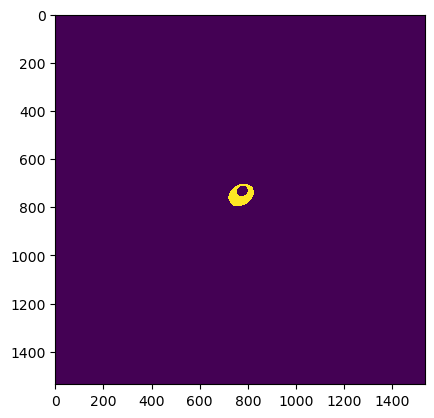

 10%|████████▌                                                                          | 4/39 [00:00<00:01, 21.75it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


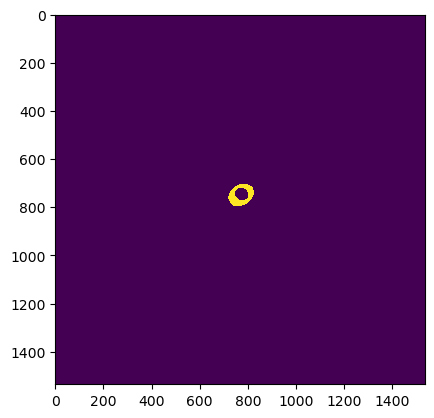

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


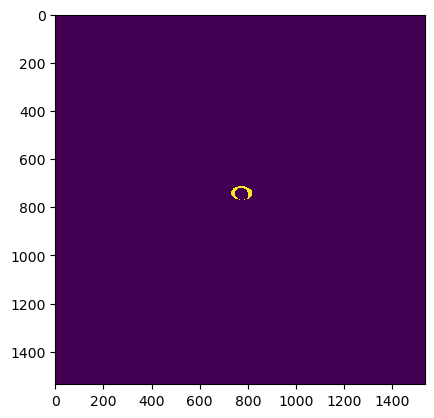

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


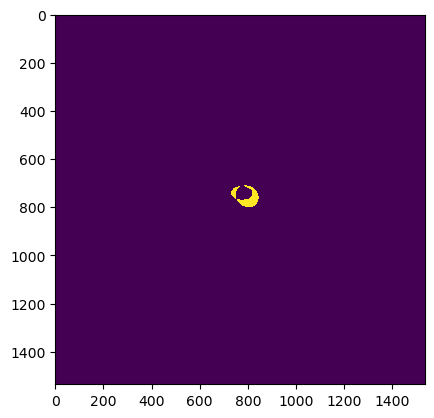

 18%|██████████████▉                                                                    | 7/39 [00:00<00:03,  8.99it/s]

(1536, 1536) (1536, 1536)
Difference: 


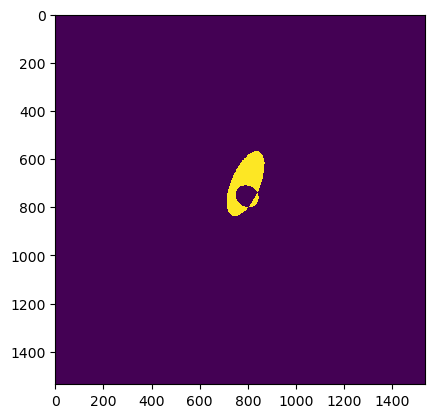

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


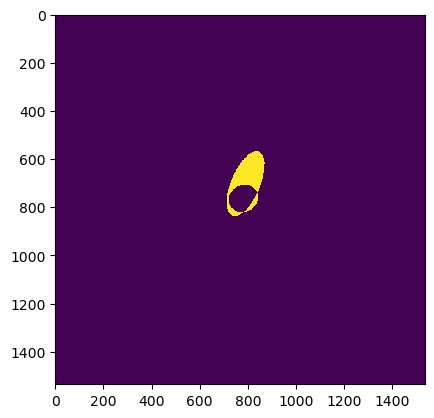

 23%|███████████████████▏                                                               | 9/39 [00:01<00:04,  7.13it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


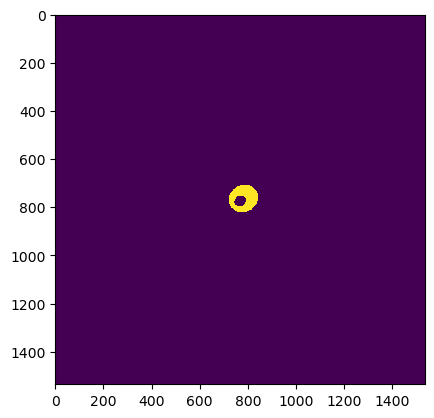

 26%|█████████████████████                                                             | 10/39 [00:01<00:04,  6.81it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


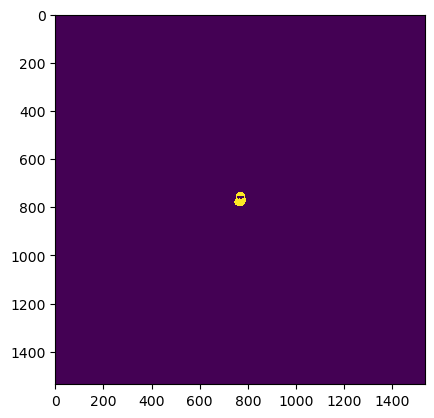

 28%|███████████████████████▏                                                          | 11/39 [00:01<00:04,  6.25it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


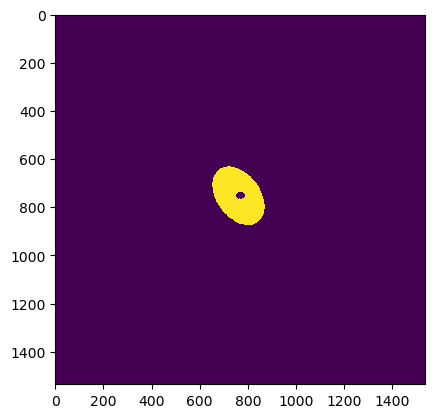

 31%|█████████████████████████▏                                                        | 12/39 [00:01<00:04,  6.02it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (768, 768)
(768, 768) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


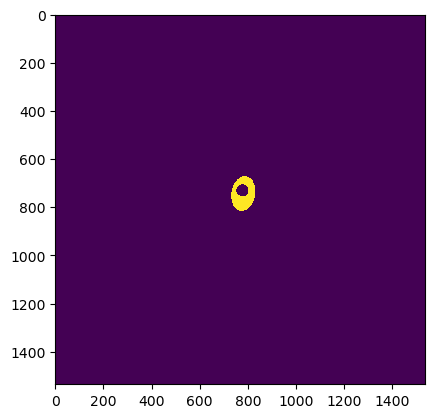

 38%|███████████████████████████████▌                                                  | 15/39 [00:01<00:02,  8.68it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


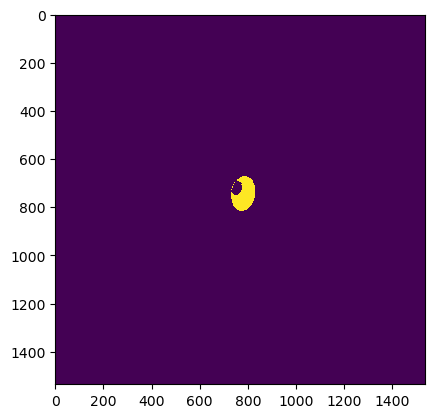

 41%|█████████████████████████████████▋                                                | 16/39 [00:02<00:02,  7.69it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


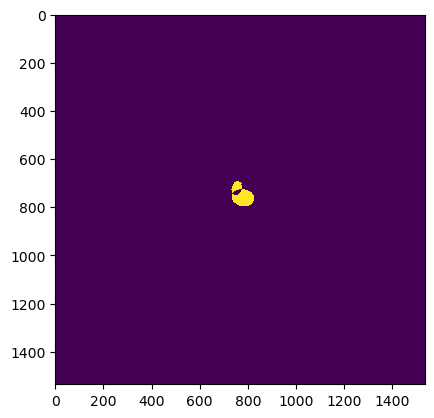

 44%|███████████████████████████████████▋                                              | 17/39 [00:02<00:03,  7.33it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


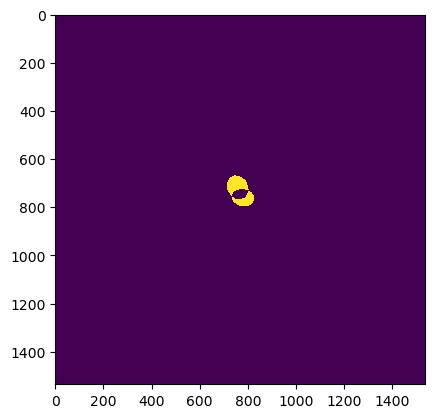

 46%|█████████████████████████████████████▊                                            | 18/39 [00:02<00:03,  6.80it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


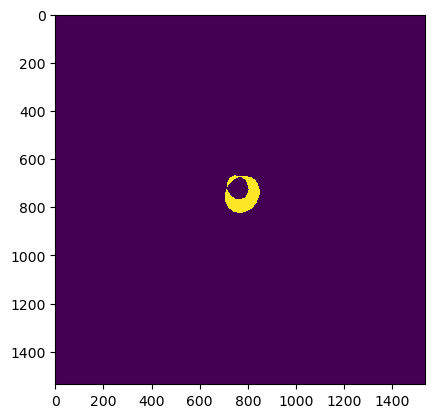

(1536, 1536) (1536, 1536)


 49%|███████████████████████████████████████▉                                          | 19/39 [00:02<00:03,  6.35it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


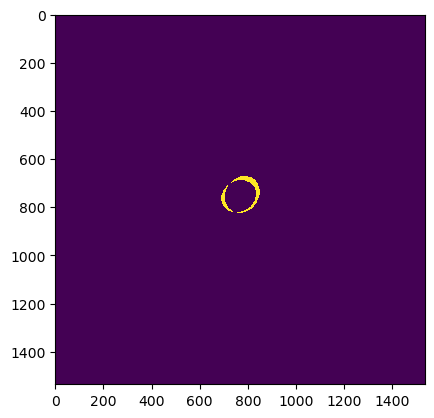

 51%|██████████████████████████████████████████                                        | 20/39 [00:02<00:03,  5.39it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


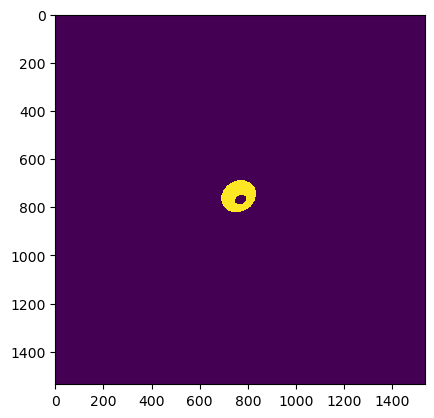

 54%|████████████████████████████████████████████▏                                     | 21/39 [00:03<00:03,  5.36it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


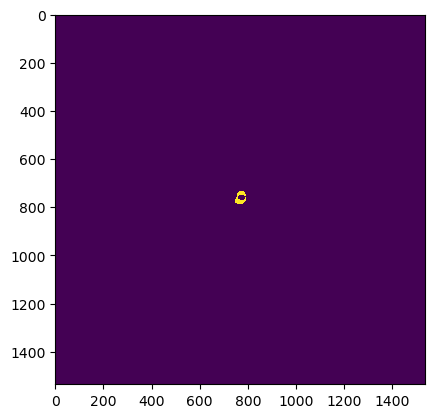

 56%|██████████████████████████████████████████████▎                                   | 22/39 [00:03<00:03,  5.44it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


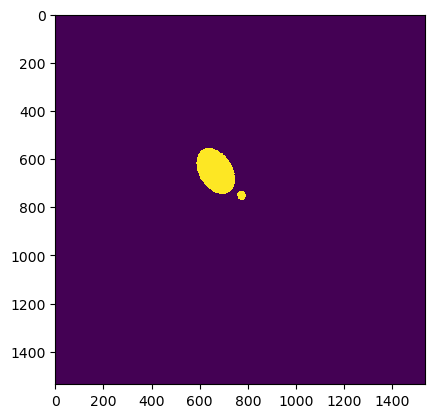

 59%|████████████████████████████████████████████████▎                                 | 23/39 [00:03<00:02,  5.64it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


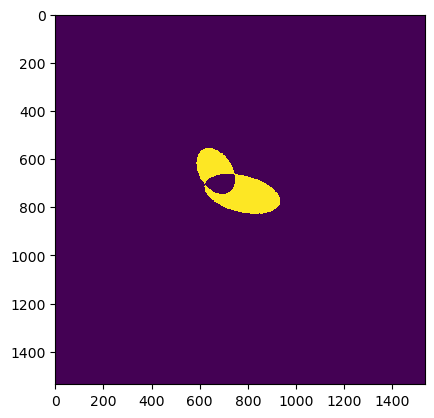

 62%|██████████████████████████████████████████████████▍                               | 24/39 [00:03<00:02,  5.57it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


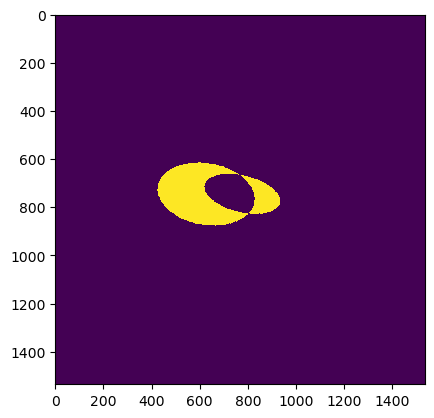

(1536, 1536) (1536, 1536)


 64%|████████████████████████████████████████████████████▌                             | 25/39 [00:03<00:02,  5.54it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


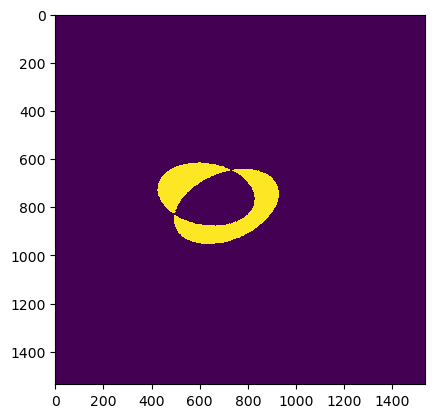

 67%|██████████████████████████████████████████████████████▋                           | 26/39 [00:03<00:02,  5.58it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


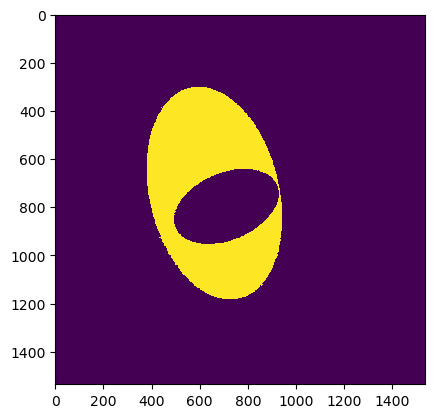

 69%|████████████████████████████████████████████████████████▊                         | 27/39 [00:04<00:02,  5.59it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


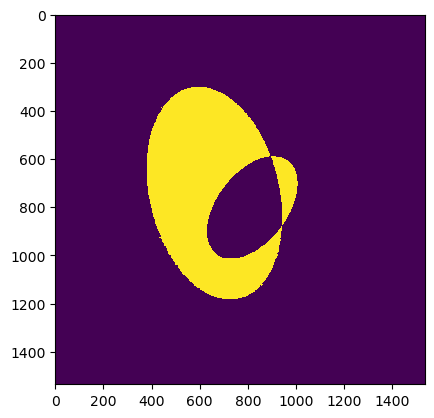

 72%|██████████████████████████████████████████████████████████▊                       | 28/39 [00:04<00:01,  5.59it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


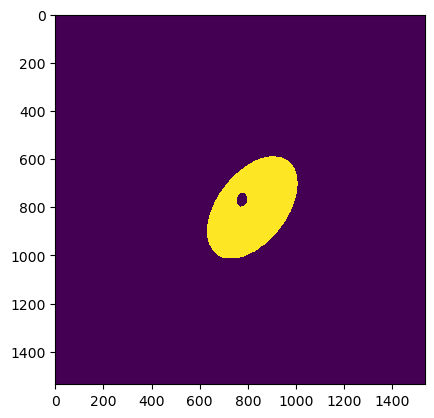

 74%|████████████████████████████████████████████████████████████▉                     | 29/39 [00:04<00:01,  5.58it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


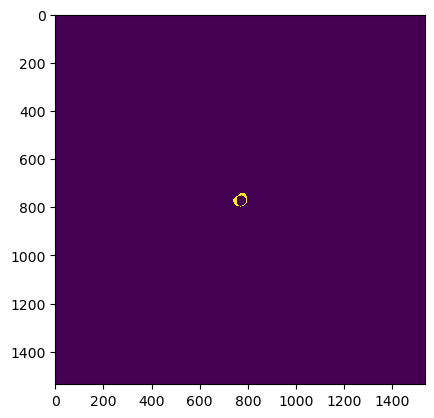

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)


 77%|███████████████████████████████████████████████████████████████                   | 30/39 [00:04<00:01,  5.55it/s]

(1536, 1536) (1536, 1536)
Difference: 


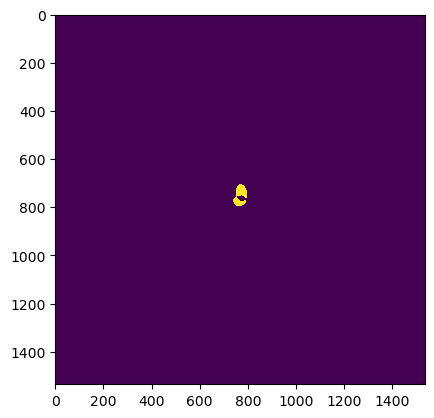

 79%|█████████████████████████████████████████████████████████████████▏                | 31/39 [00:04<00:01,  5.64it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


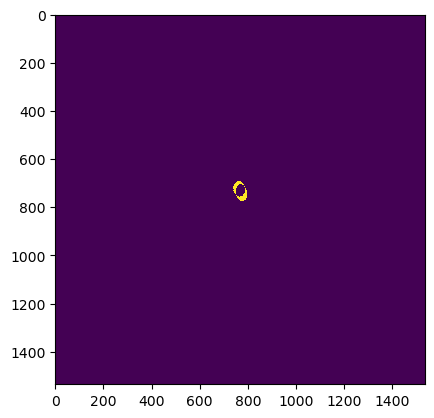

 82%|███████████████████████████████████████████████████████████████████▎              | 32/39 [00:04<00:01,  5.76it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


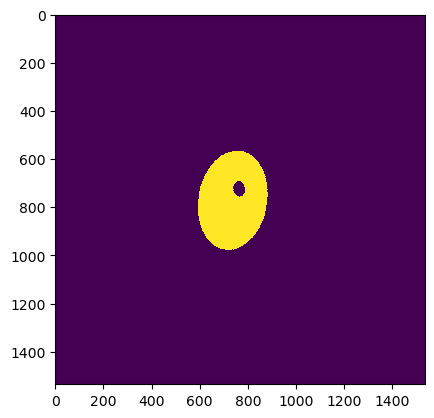

(1536, 1536) (1536, 1536)


 85%|█████████████████████████████████████████████████████████████████████▍            | 33/39 [00:05<00:01,  5.63it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


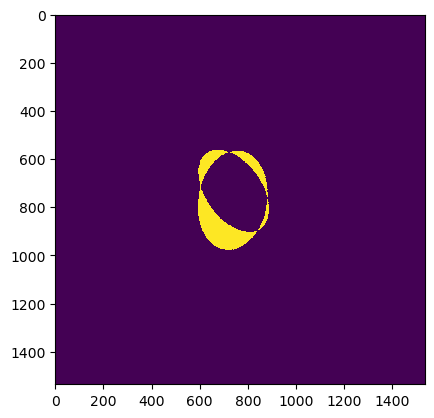

 87%|███████████████████████████████████████████████████████████████████████▍          | 34/39 [00:05<00:00,  5.66it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


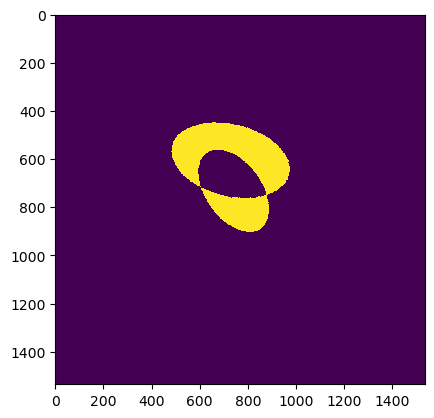

 90%|█████████████████████████████████████████████████████████████████████████▌        | 35/39 [00:05<00:00,  5.61it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


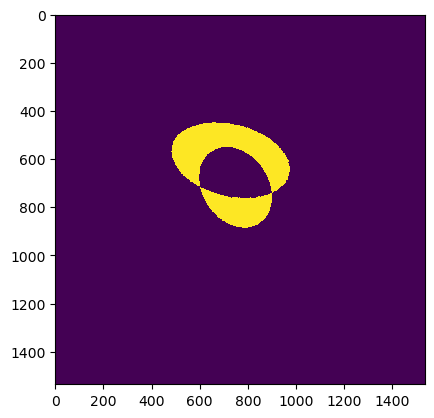

 92%|███████████████████████████████████████████████████████████████████████████▋      | 36/39 [00:05<00:00,  5.61it/s]

(1536, 1536) (1536, 1536)
Difference: 


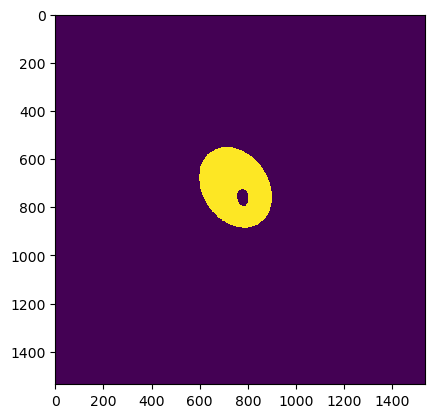

 95%|█████████████████████████████████████████████████████████████████████████████▊    | 37/39 [00:05<00:00,  4.80it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


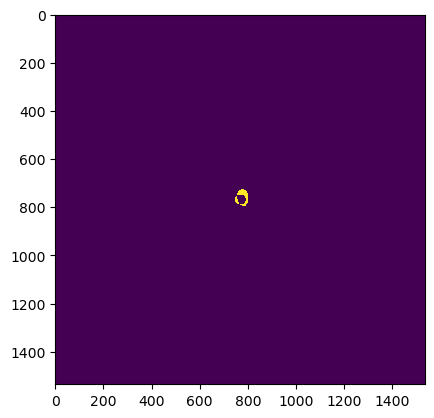

 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:06<00:00,  5.06it/s]

(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
(1536, 1536) (1536, 1536)
Difference: 


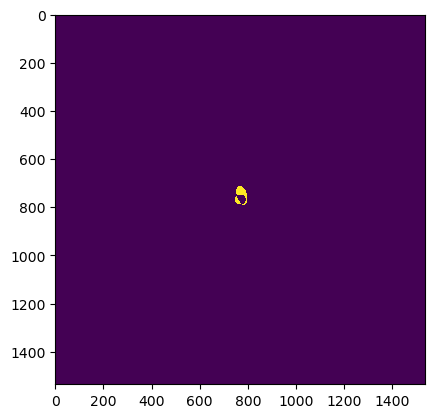

(1536, 1536) (1536, 1536)


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:06<00:00,  6.16it/s]

(1536, 1536) (1536, 1536)


In [39]:
#DEBUGGING
from matplotlib import image
import numpy as np
def load_npy(folder, identifier):
    """
    Loads previously saved numpy array

    :param folder: folder in which the data was saved
    :param identifier: data identifier with which it was saved, used to reconstruct the filename
    :return: retrieved numpy array or None if it could not be found
    """
    filepath = npy_file_path(folder, identifier)
    if os.path.exists(filepath):
        return np.load(filepath)
    else:
        return None


def npy_file_path(folder, identifier):
    return os.path.join(folder, f'{identifier.to_filename()}.npy')

class Identifier:
    def __init__(self):
        self.tuple = ()

    def to_filename(self):
        filename = ''
        for elem in self.tuple:
            filename += str(elem) + '_'
        return filename[:-1]
warped_labels_folder = output_folders['warped_labels']
#print(volume_identifiers)
previmg = load_npy(warped_labels_folder, volume_identifiers[0].part_identifiers()[0])
part_identifier = volume_identifiers[0].part_identifiers()[0]
key = part_identifier.eye + str(part_identifier.subject_id) + part_identifier.group
for identifier in tqdm(volume_identifiers):
        label_images, homography_transforms = {}, {}
        for part_identifier in identifier.part_identifiers():
            prevkey = key
            key = part_identifier.eye + str(part_identifier.subject_id) + part_identifier.group
            img = load_npy(warped_labels_folder, part_identifier)
            print(previmg.shape,img.shape)
            if (previmg.shape != img.shape or (previmg != img).any()) and (key != prevkey):
                try:
                    if((previmg != img).any()):
                        print('Difference: ')
                        plt.imshow((previmg != img), interpolation='nearest')
                        plt.show()
                except:
                    pass
                previmg =  load_npy(warped_labels_folder, part_identifier)
            #label_images[part_identifier.part] = load_npy(warped_labels_folder, part_identifier)
            


In [16]:
preprocessing.pair_octs_with_labels(
    volume_identifiers, output_folders['warped_labels'],
    output_folders['homography'], output_folders['labelled_octs']
)

  3%|██▏                                                                                | 1/39 [00:00<00:11,  3.32it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)


  5%|████▎                                                                              | 2/39 [00:00<00:14,  2.48it/s]

MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
(496, 512)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 10%|████████▌                                                                          | 4/39 [00:01<00:10,  3.47it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 13%|██████████▋                                                                        | 5/39 [00:01<00:10,  3.34it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 15%|████████████▊                                                                      | 6/39 [00:01<00:11,  2.97it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 18%|██████████████▉                                                                    | 7/39 [00:02<00:11,  2.70it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 21%|█████████████████                                                                  | 8/39 [00:03<00:19,  1.56it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 23%|███████████████████▏                                                               | 9/39 [00:04<00:18,  1.59it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)


 26%|█████████████████████                                                             | 10/39 [00:04<00:15,  1.91it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 28%|███████████████████████▏                                                          | 11/39 [00:04<00:11,  2.34it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 31%|█████████████████████████▏                                                        | 12/39 [00:05<00:17,  1.50it/s]

MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)


 33%|███████████████████████████▎                                                      | 13/39 [00:06<00:17,  1.47it/s]

MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
(496, 512)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 36%|█████████████████████████████▍                                                    | 14/39 [00:06<00:14,  1.77it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 38%|███████████████████████████████▌                                                  | 15/39 [00:07<00:14,  1.69it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)


 41%|█████████████████████████████████▋                                                | 16/39 [00:07<00:11,  2.01it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 44%|███████████████████████████████████▋                                              | 17/39 [00:08<00:10,  2.17it/s]

MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 46%|█████████████████████████████████████▊                                            | 18/39 [00:08<00:08,  2.56it/s]

MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 49%|███████████████████████████████████████▉                                          | 19/39 [00:09<00:09,  2.07it/s]

MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 54%|████████████████████████████████████████████▏                                     | 21/39 [00:10<00:08,  2.03it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 56%|██████████████████████████████████████████████▎                                   | 22/39 [00:10<00:07,  2.32it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 59%|████████████████████████████████████████████████▎                                 | 23/39 [00:11<00:08,  1.82it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 62%|██████████████████████████████████████████████████▍                               | 24/39 [00:12<00:08,  1.72it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 64%|████████████████████████████████████████████████████▌                             | 25/39 [00:13<00:09,  1.43it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 67%|██████████████████████████████████████████████████████▋                           | 26/39 [00:13<00:08,  1.59it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 69%|████████████████████████████████████████████████████████▊                         | 27/39 [00:15<00:12,  1.05s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 72%|██████████████████████████████████████████████████████████▊                       | 28/39 [00:16<00:12,  1.13s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 74%|████████████████████████████████████████████████████████████▉                     | 29/39 [00:17<00:08,  1.13it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 77%|███████████████████████████████████████████████████████████████                   | 30/39 [00:17<00:06,  1.43it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 79%|█████████████████████████████████████████████████████████████████▏                | 31/39 [00:17<00:04,  1.61it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 82%|███████████████████████████████████████████████████████████████████▎              | 32/39 [00:18<00:03,  1.79it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 85%|█████████████████████████████████████████████████████████████████████▍            | 33/39 [00:19<00:05,  1.19it/s]

MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 87%|███████████████████████████████████████████████████████████████████████▍          | 34/39 [00:21<00:04,  1.04it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 76

 90%|█████████████████████████████████████████████████████████████████████████▌        | 35/39 [00:22<00:04,  1.10s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 92%|███████████████████████████████████████████████████████████████████████████▋      | 36/39 [00:22<00:02,  1.14it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 95%|█████████████████████████████████████████████████████████████████████████████▊    | 37/39 [00:23<00:01,  1.35it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:23<00:00,  1.65it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:23<00:00,  1.63it/s]

MAURO: (496, 768)
MAURO: (496, 768)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


Preprocessing OCT scans - flattening, segmentation, retinal thickness


  0%|                                                                                           | 0/39 [00:00<?, ?it/s]

MAURO: (496, 768)
here is the oct: 


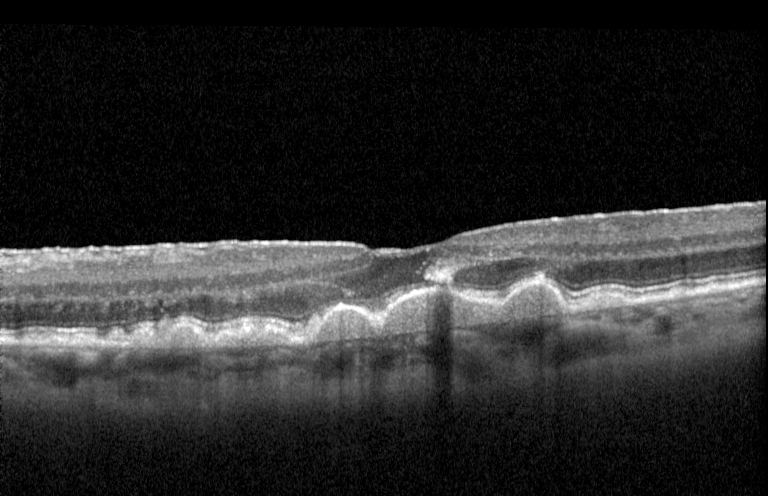

here is the segmentations: INFL and ONFL


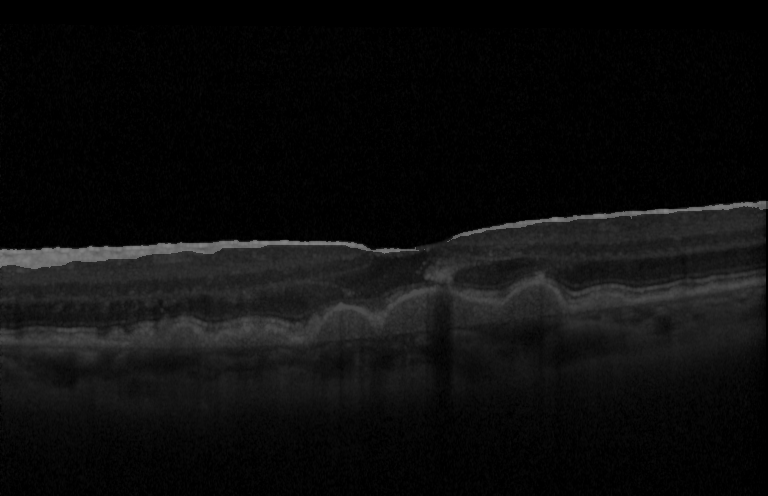

here is the segmentations: ONFL and IPL


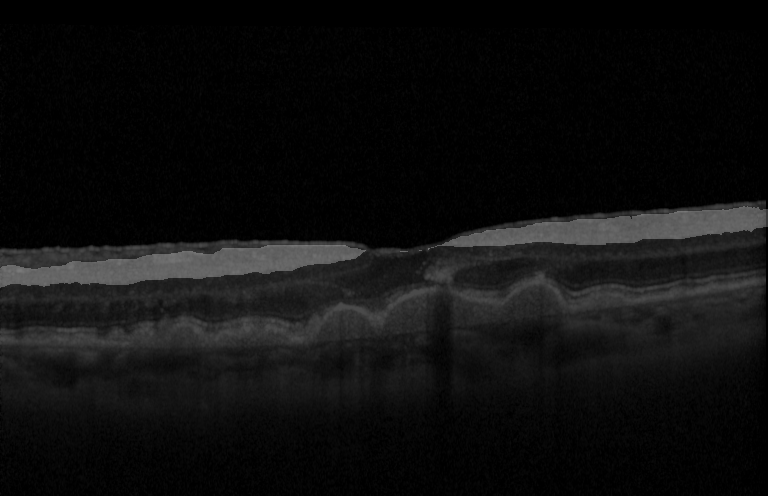

here is the segmentations: IPL and OPL


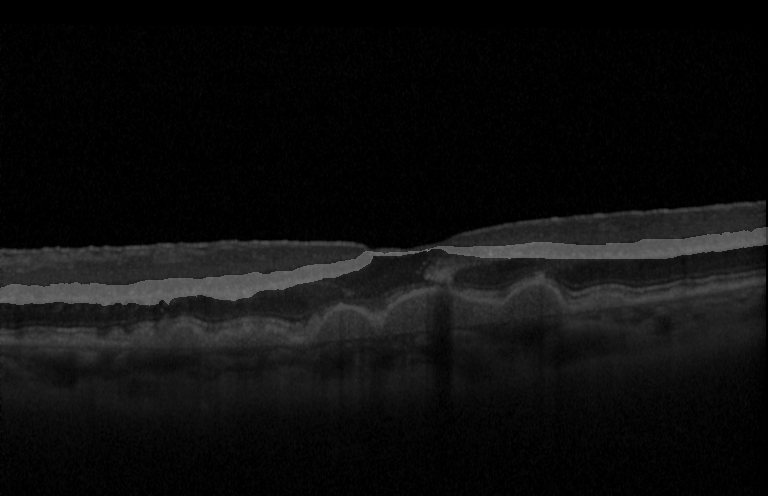

here is the segmentations: OPL and ICL


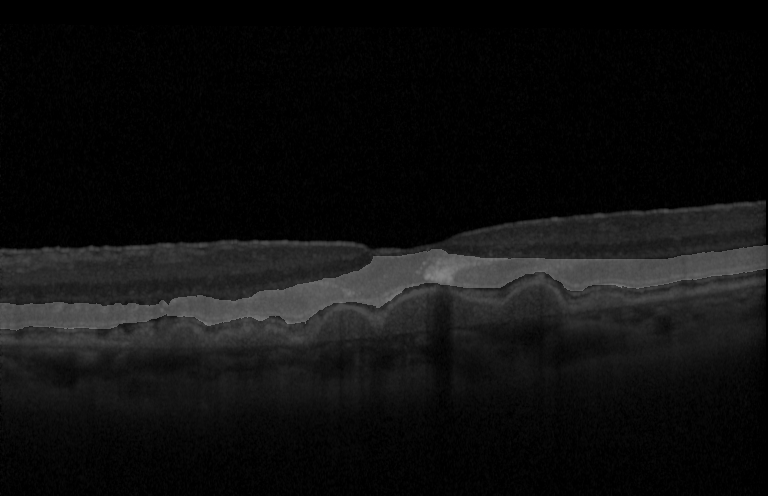

here is the segmentations: ICL and RPE


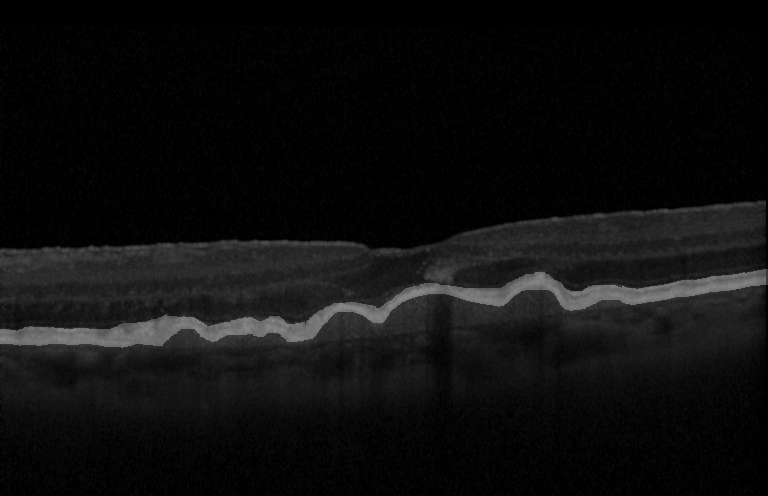

here is the flattened_oct_image:  5.0


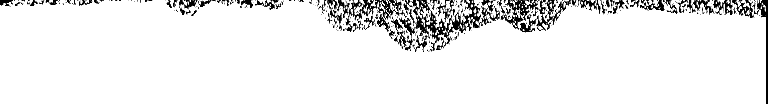

here is the flattened_labelled_segmentation:  5.0


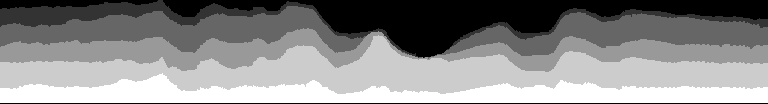

MAURO: (496, 768)
here is the oct: 


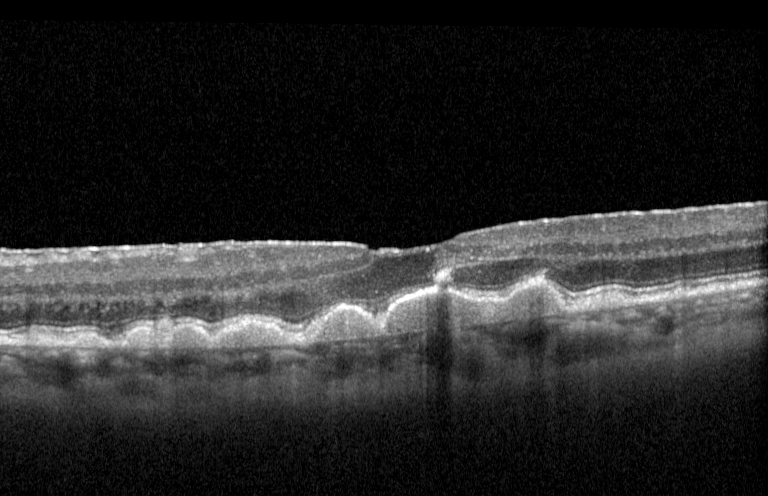

here is the segmentations: INFL and ONFL


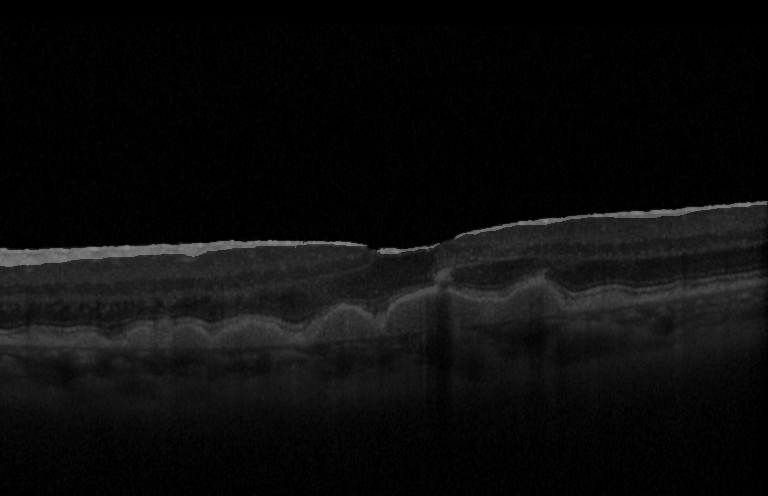

here is the segmentations: ONFL and IPL


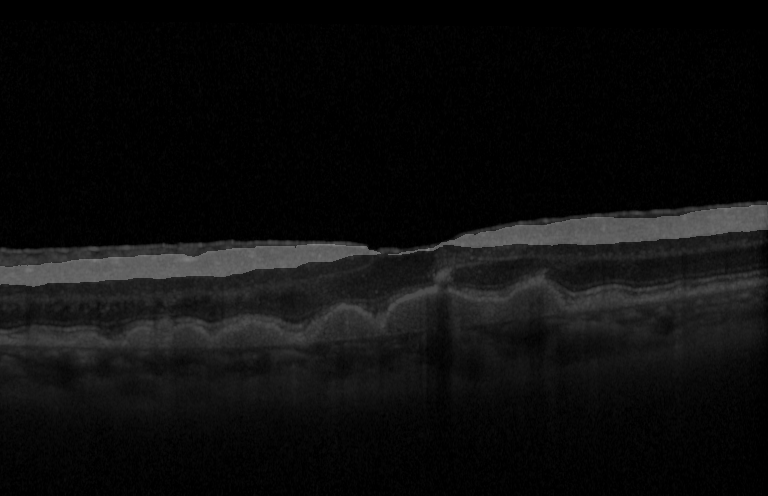

here is the segmentations: IPL and OPL


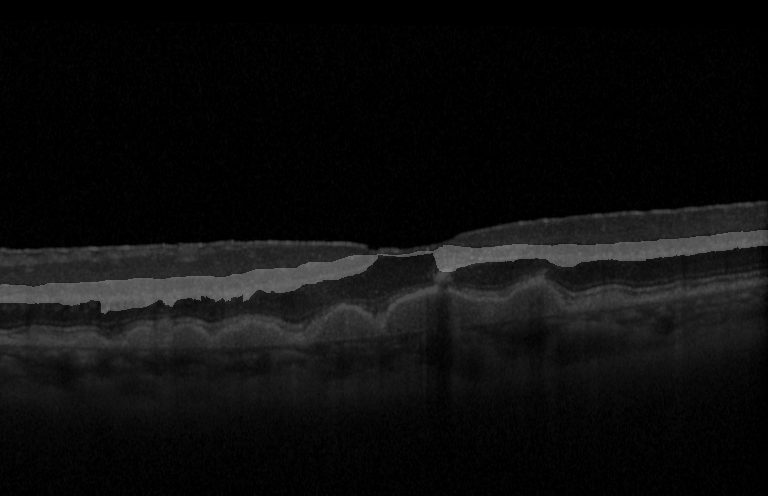

here is the segmentations: OPL and ICL


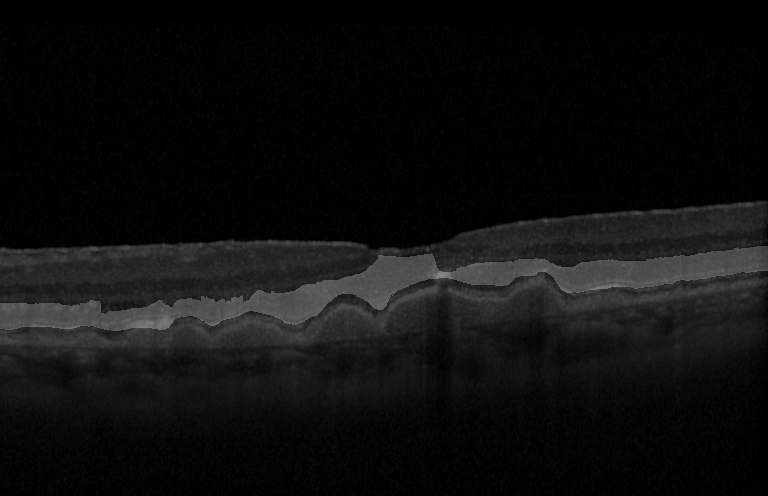

here is the segmentations: ICL and RPE


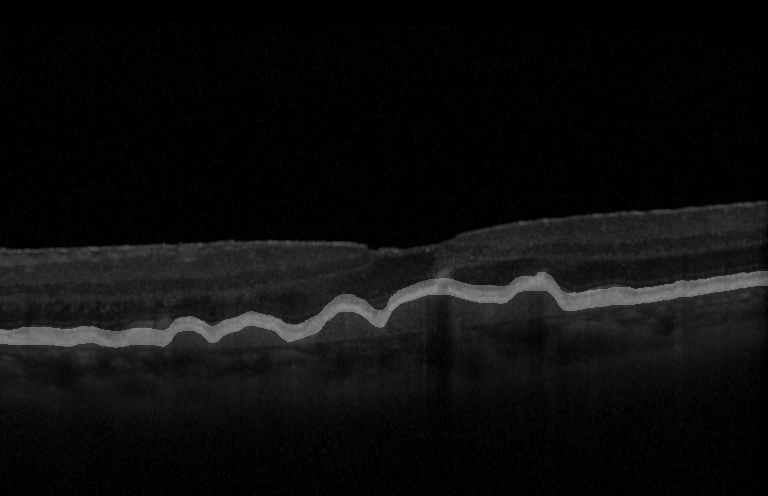

here is the flattened_oct_image:  5.0


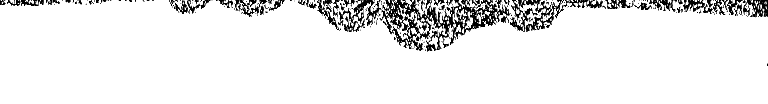

here is the flattened_labelled_segmentation:  5.0


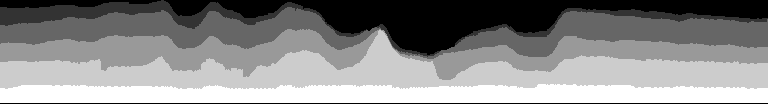

MAURO: (496, 768)
here is the oct: 


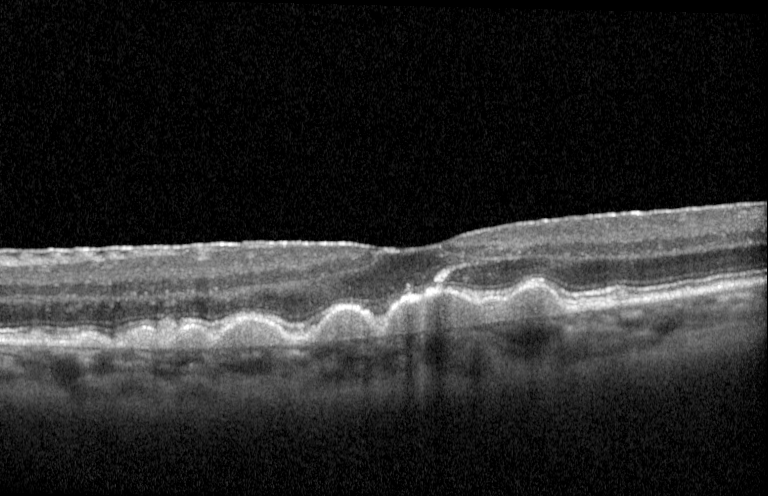

here is the segmentations: INFL and ONFL


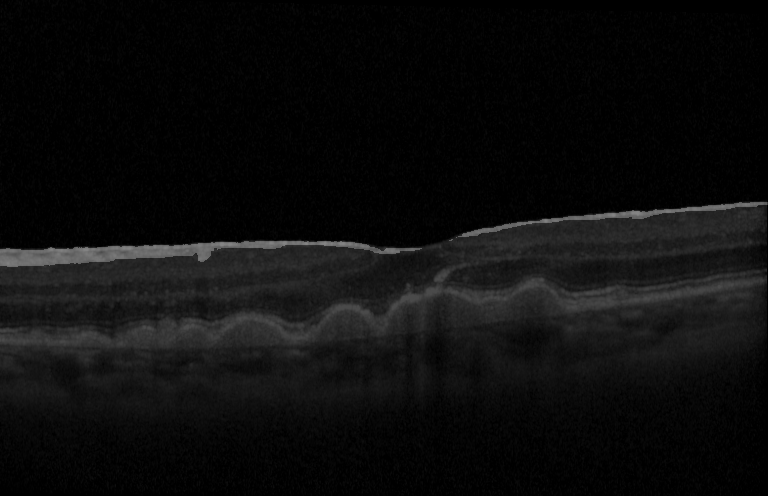

here is the segmentations: ONFL and IPL


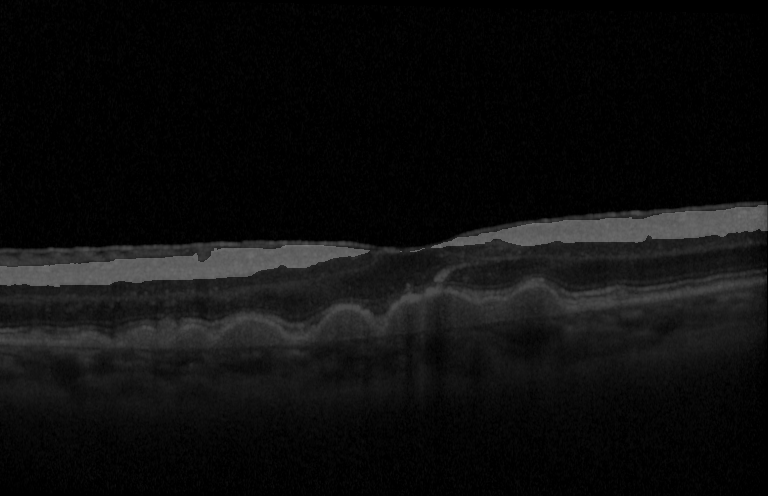

here is the segmentations: IPL and OPL


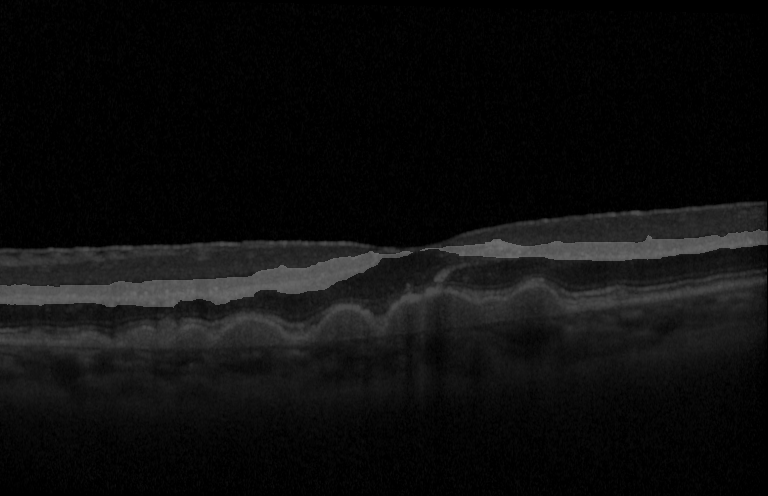

here is the segmentations: OPL and ICL


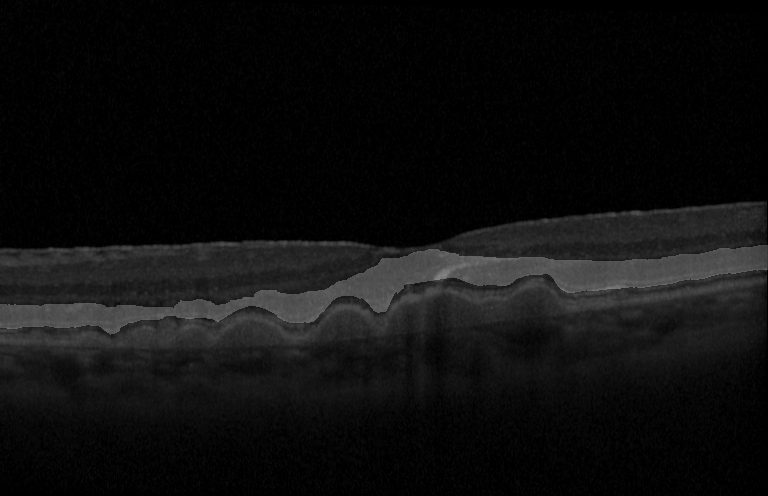

here is the segmentations: ICL and RPE


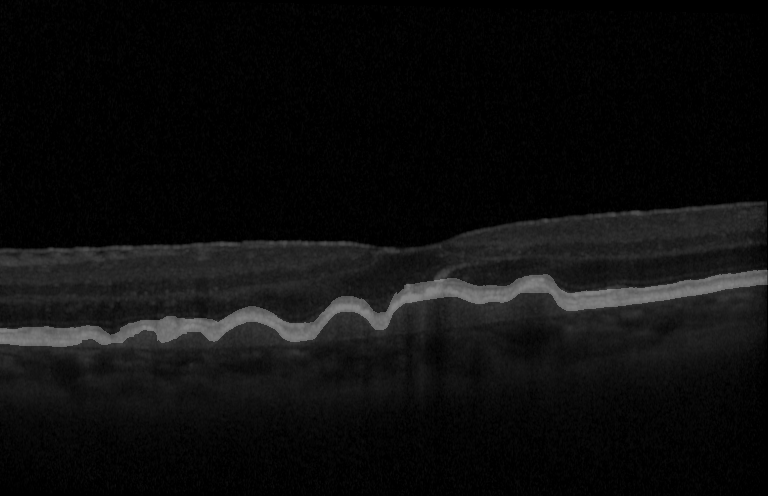

here is the flattened_oct_image:  5.0


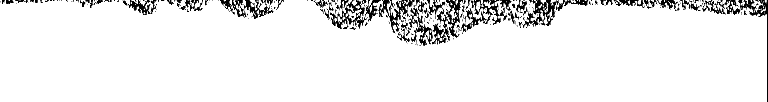

here is the flattened_labelled_segmentation:  5.0


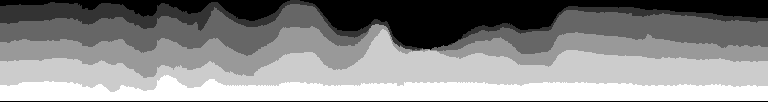

MAURO: (496, 768)
here is the oct: 


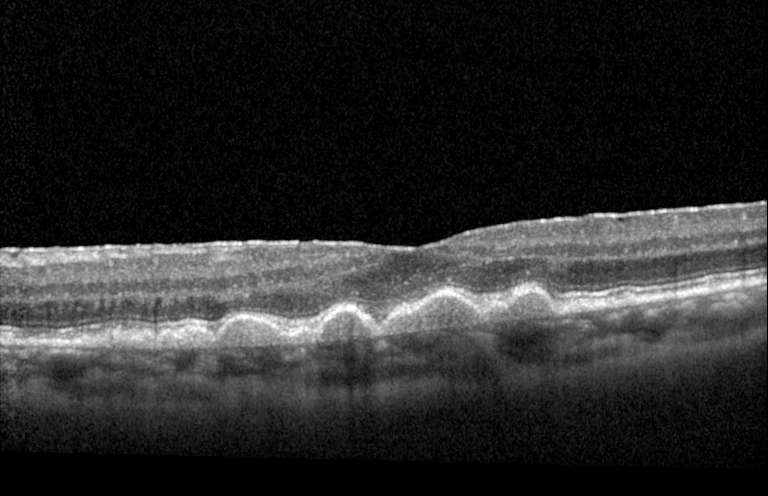

here is the segmentations: INFL and ONFL


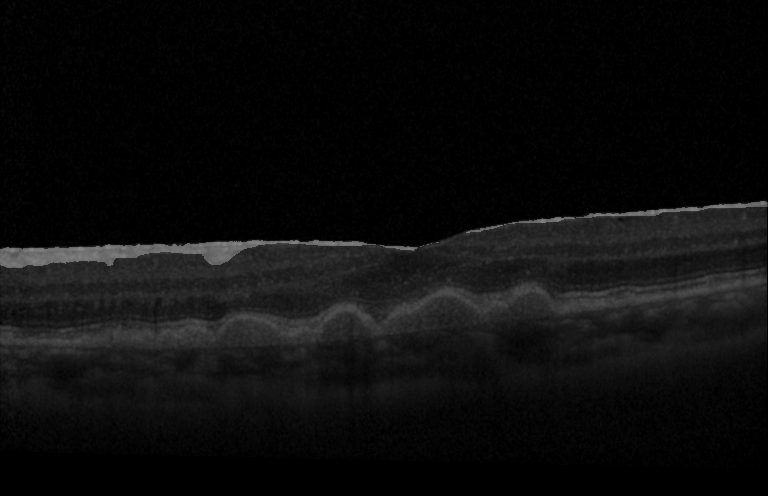

here is the segmentations: ONFL and IPL


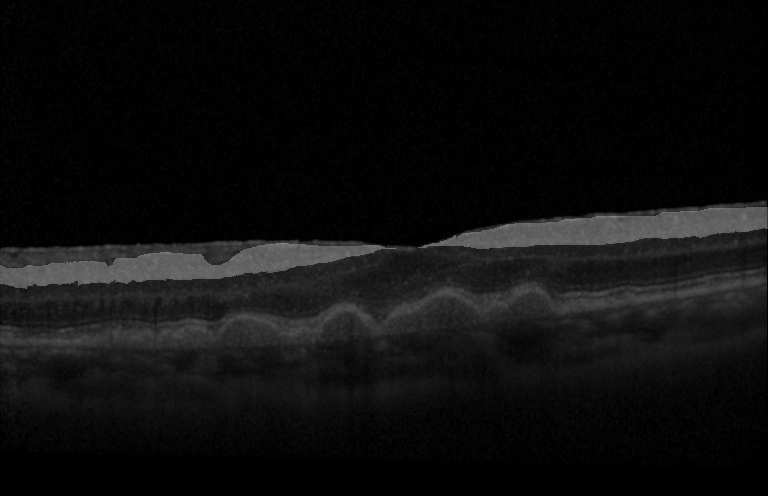

here is the segmentations: IPL and OPL


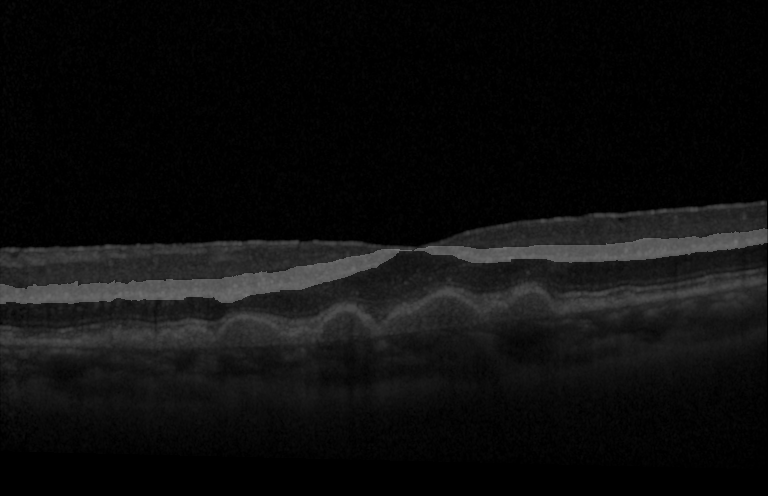

here is the segmentations: OPL and ICL


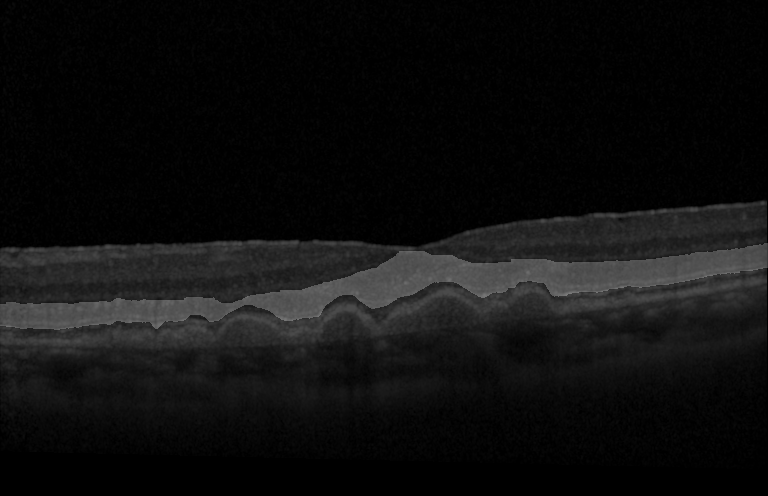

here is the segmentations: ICL and RPE


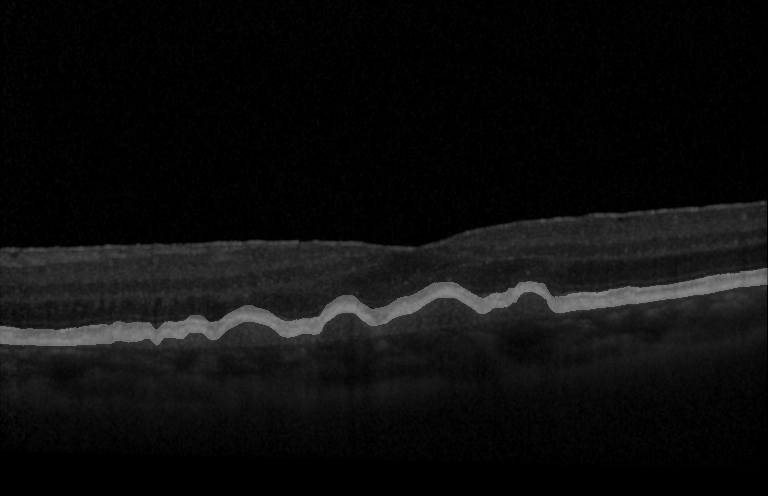

here is the flattened_oct_image:  5.0


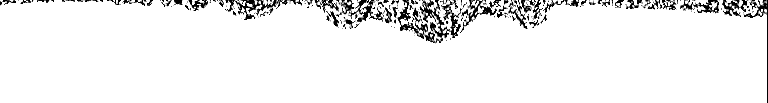

here is the flattened_labelled_segmentation:  5.0


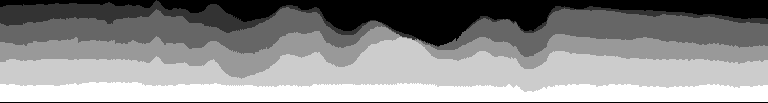

MAURO: (496, 768)
here is the oct: 


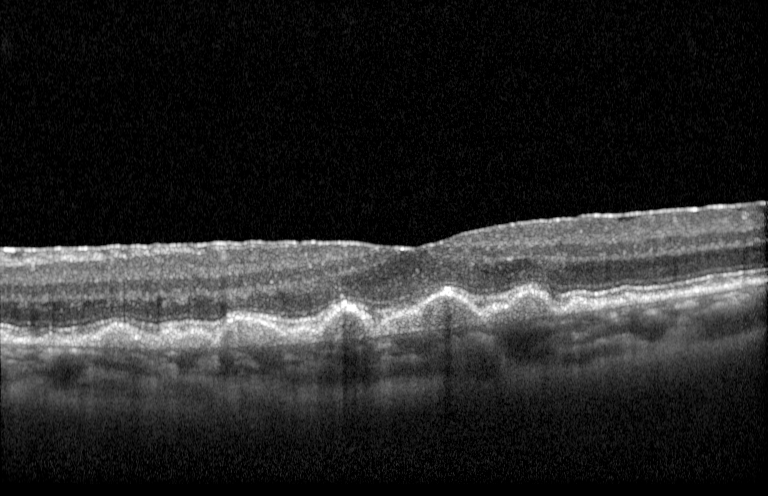

here is the segmentations: INFL and ONFL


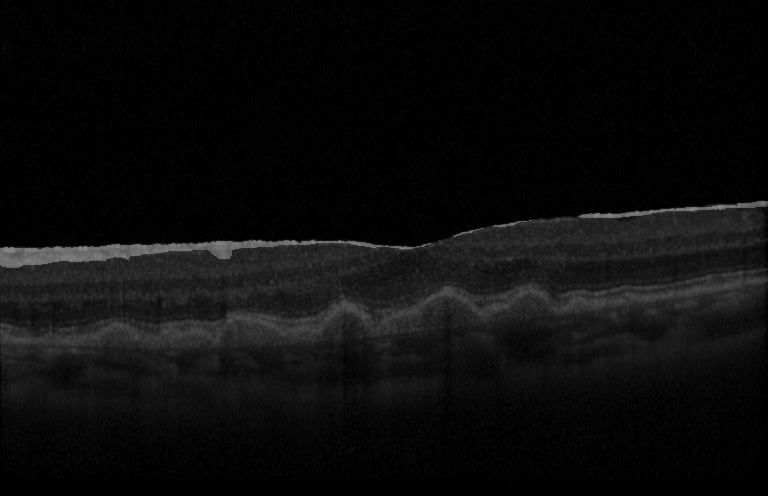

here is the segmentations: ONFL and IPL


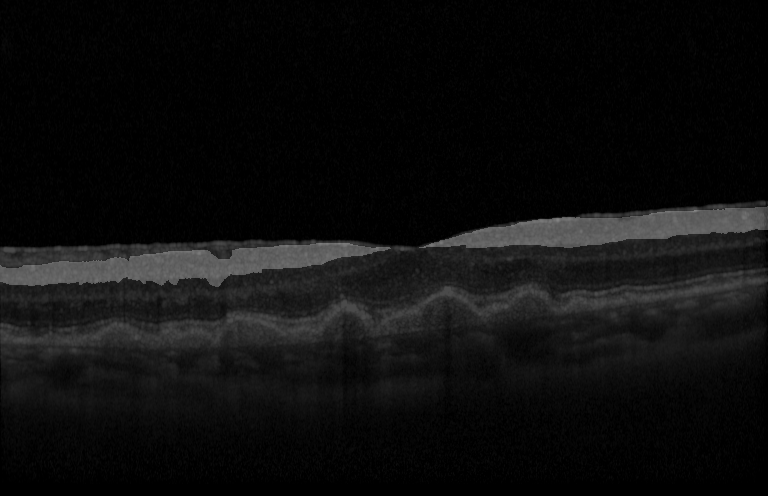

here is the segmentations: IPL and OPL


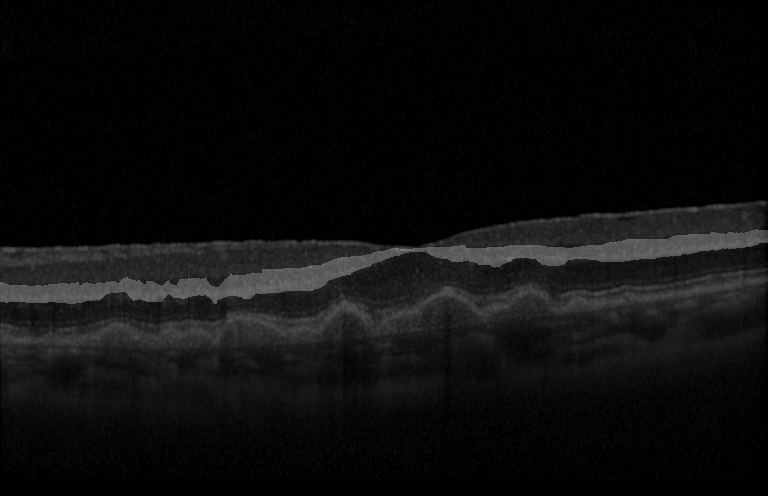

here is the segmentations: OPL and ICL


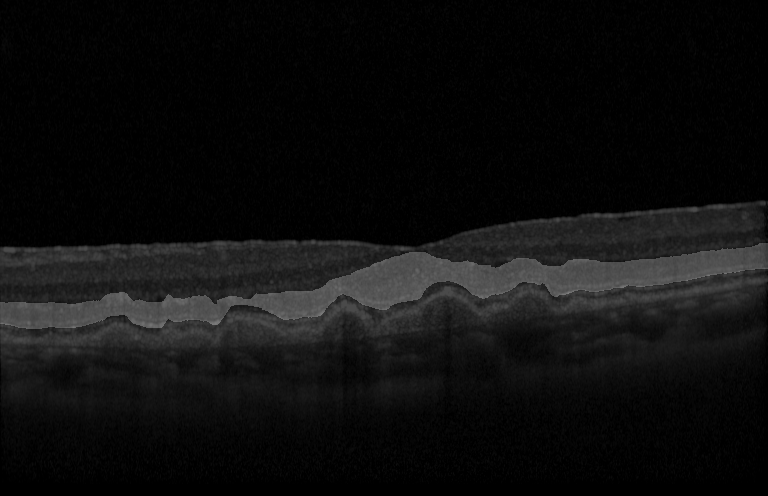

here is the segmentations: ICL and RPE


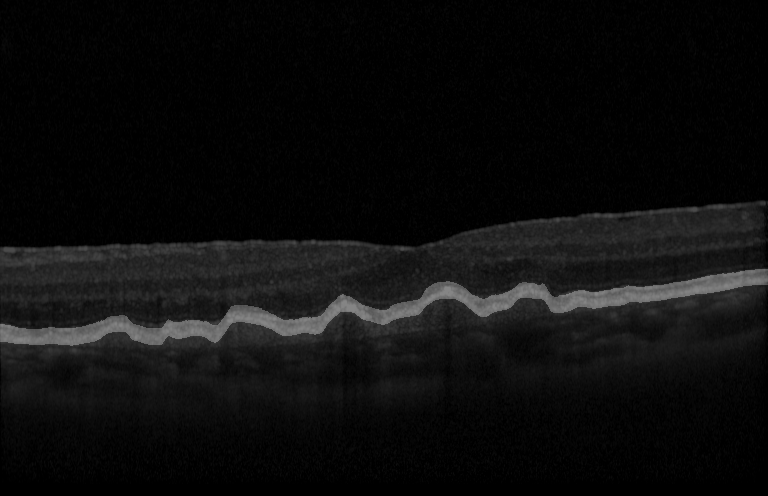

here is the flattened_oct_image:  5.0


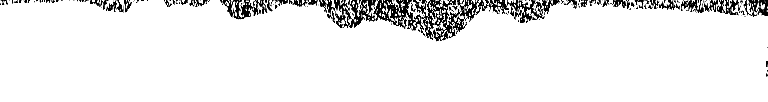

here is the flattened_labelled_segmentation:  5.0


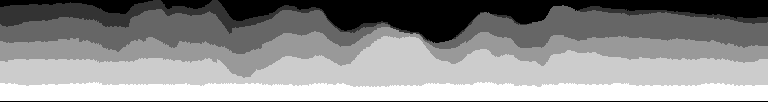

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


  3%|██▏                                                                                | 1/39 [00:04<02:55,  4.62s/it]

MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)


  5%|████▎                                                                              | 2/39 [00:05<01:26,  2.33s/it]

MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 10%|████████▌                                                                          | 4/39 [00:06<00:37,  1.08s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 13%|██████████▋                                                                        | 5/39 [00:06<00:30,  1.11it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 15%|████████████▊                                                                      | 6/39 [00:07<00:27,  1.20it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 18%|██████████████▉                                                                    | 7/39 [00:08<00:26,  1.20it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (49

 21%|█████████████████                                                                  | 8/39 [00:10<00:43,  1.41s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 23%|███████████████████▏                                                               | 9/39 [00:11<00:40,  1.34s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 26%|█████████████████████                                                             | 10/39 [00:12<00:30,  1.05s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 28%|███████████████████████▏                                                          | 11/39 [00:12<00:22,  1.24it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 31%|█████████████████████████▏                                                        | 12/39 [00:14<00:32,  1.22s/it]

MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 512)


 36%|█████████████████████████████▍                                                    | 14/39 [00:16<00:22,  1.13it/s]

MAURO: (496, 512)
MAURO: (496, 512)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 38%|███████████████████████████████▌                                                  | 15/39 [00:17<00:23,  1.02it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 41%|█████████████████████████████████▋                                                | 16/39 [00:17<00:18,  1.21it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 44%|███████████████████████████████████▋                                              | 17/39 [00:18<00:16,  1.30it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 46%|█████████████████████████████████████▊                                            | 18/39 [00:18<00:12,  1.67it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 49%|███████████████████████████████████████▉                                          | 19/39 [00:19<00:16,  1.22it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 51%|██████████████████████████████████████████                                        | 20/39 [00:21<00:20,  1.07s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 54%|████████████████████████████████████████████▏                                     | 21/39 [00:21<00:15,  1.18it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 56%|██████████████████████████████████████████████▎                                   | 22/39 [00:22<00:12,  1.40it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 59%|████████████████████████████████████████████████▎                                 | 23/39 [00:23<00:16,  1.00s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 62%|██████████████████████████████████████████████████▍                               | 24/39 [00:25<00:16,  1.08s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 64%|████████████████████████████████████████████████████▌                             | 25/39 [00:27<00:19,  1.36s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 67%|██████████████████████████████████████████████████████▋                           | 26/39 [00:28<00:15,  1.21s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (49

 69%|████████████████████████████████████████████████████████▊                         | 27/39 [00:32<00:25,  2.13s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (49

 72%|██████████████████████████████████████████████████████████▊                       | 28/39 [00:35<00:25,  2.32s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 74%|████████████████████████████████████████████████████████████▉                     | 29/39 [00:35<00:17,  1.78s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 77%|███████████████████████████████████████████████████████████████                   | 30/39 [00:36<00:12,  1.36s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 79%|█████████████████████████████████████████████████████████████████▏                | 31/39 [00:36<00:09,  1.16s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 82%|███████████████████████████████████████████████████████████████████▎              | 32/39 [00:37<00:06,  1.02it/s]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (49

 85%|█████████████████████████████████████████████████████████████████████▍            | 33/39 [00:40<00:09,  1.61s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (49

 87%|███████████████████████████████████████████████████████████████████████▍          | 34/39 [00:43<00:09,  1.96s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (49

 90%|█████████████████████████████████████████████████████████████████████████▌        | 35/39 [00:46<00:09,  2.26s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 92%|███████████████████████████████████████████████████████████████████████████▋      | 36/39 [00:46<00:05,  1.78s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 95%|█████████████████████████████████████████████████████████████████████████████▊    | 37/39 [00:47<00:02,  1.43s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:47<00:01,  1.12s/it]

MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)
MAURO: (496, 768)


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:48<00:00,  1.24s/it]

MAURO: (496, 768)
MAURO: (496, 768)
Missed 21 from total 1004
15 missing mappings and 6 nonexistent meta files


In [17]:
tqdm.write('Preprocessing OCT scans - flattening, segmentation, retinal thickness')
eye_identifiers = preprocessing.part_identifiers_to_unique_eye_identifiers(part_identifiers)
filename_to_meta_mapping = preprocessing.load_filename_to_meta_mapping(parameters['mapping'])

missing_mappings, nonexistent_meta_files = preprocessing.create_preprocessed_oct_scans(
    eye_identifiers, output_folders['labelled_octs'], parameters['meta'], filename_to_meta_mapping, output_folders['preprocessed_octs']
)

In [18]:
print('missing_mappings are labelled OCT B-scans data for scans whose meta filename was \
not present in filename_to_meta_mapping: ',missing_mappings,'\n')

print('nonexistent_meta_files are meta filenames that were expected to be found based on \
the filename_to_meta_mapping but where not found under the meta folder hierarchy: ',nonexistent_meta_files)

missing_mappings are labelled OCT B-scans data for scans whose meta filename was not present in filename_to_meta_mapping:  [('control/spectralis/oct/lue_left_center/9C3CB050.tif', []), ('amd/spectralis/oct/caj_right_up/97079FA0.tif', []), ('amd/spectralis/oct/caj_right_center/A5D3C540.tif', []), ('control/spectralis/oct/boc_right_center/B0529FD0.tif', []), ('control/spectralis/oct/boc_right_center/B060F7B0.tif', []), ('control/spectralis/oct/boc_right_center/B071C090.tif', []), ('control/spectralis/oct/boc_right_center/B0826260.tif', []), ('control/spectralis/oct/moe_right_up/765BC830.tif', []), ('control/spectralis/oct/moe_right_up/766EDB00.tif', []), ('control/spectralis/oct/pem_right_center/201AC6A0.tif', []), ('amd/spectralis/oct/gaj_right_up/1457880.tif', []), ('amd/spectralis/oct/wim_right_center/1CF53E0.tif', []), ('control/spectralis/oct/bas_right_up/204EA080.tif', []), ('control/spectralis/oct/gec_right_up/B522AB40.tif', []), ('control/spectralis/oct/gec_right_center/D98CDFA0.

# Check preprocessed

In [19]:
n = 0
mismatch = 0
mismatched_identifiers = set({})
for identifier in eye_identifiers:
    data = preprocessing.load_pickle(output_folders['preprocessed_octs'], identifier)
    if data is not None:
        for preprocessed_scan in data:
            n += 1
            label_len = len(preprocessed_scan.label())
            image_width = preprocessed_scan.image().shape[1]
            segmentation_width = preprocessed_scan.segmentation('INFL', 'ONFL').shape[1]
            thickness_width = len(preprocessed_scan.thickness(None, None))
            if not (label_len == image_width == segmentation_width == thickness_width):
                mismatch += 1
                mismatched_identifiers.add(identifier)
print(f'Mismatched {mismatch}/{n}')

Mismatched 0/983


In [20]:
mismatched_part_identifier_tuples = set({})
for mid in mismatched_identifiers:
    data = preprocessing.load_pickle(output_folders['preprocessed_octs'], mid)
    for scan in data:
        mismatched_part_identifier_tuples.add((mid.group, mid.subject_id, mid.eye, scan._scan.part))
mismatched_part_identifiers = [preprocessing.PartIdentifier(group, subject_id, eye, part)
                               for group, subject_id, eye, part in mismatched_part_identifier_tuples]

In [ ]:
mismatched_labeled_octs = '/chuvdatarc/ja8818/RAD/LINE/Benedetta_Franceschiello/5_OCTs_Jakub_Gwizdala/0_backup_folder_development/AMD/preprocessing/mismatched_labelled_octs'

### Pairing the scans in which label length is incorrect

In [23]:
mismatched_volume_identifiers = preprocessing.get_volume_identifiers(mismatched_part_identifiers)
preprocessing.pair_octs_with_labels(
    mismatched_volume_identifiers, output_folders['warped_labels'],
    output_folders['homography'], mismatched_labeled_octs
)

0it [00:00, ?it/s]


In [24]:
shapes = set({})
for part_identifier in part_identifiers:
    label = preprocessing.load_npy(output_folders['warped_labels'], part_identifier)
    shapes.add(label.shape[0])

In [25]:
shapes

{768, 1536}

# Visual check of preprocessed data

In [26]:
import preprocessing
import matplotlib.pyplot as plt

from preprocessing import *
from skimage import draw

In [27]:
import dataset, coregister

In [28]:
root_config = 'C:\\Users\\line\\Desktop\\Mauro\\2_Preprocessing_Code\\config'
dataset_config = os.path.join(root_config, 'dataset.txt')
output_config = os.path.join(root_config, 'output.txt')
parameters_config = os.path.join(root_config, 'parameters.txt')

_ = dataset.initialize(dataset_config)
output_folders = preprocessing.parse_config_file(output_config)

### Example with 1536-sized label

In [29]:
part = 'full'
group, subject_id, eye = 'amd', 4, 'left'

part_identifier = preprocessing.PartIdentifier(group, subject_id, eye, part)
eye_identifier = part_identifier.to_eye_identifier()
bcea = dataset.image(dataset.image_path(subject_id, group, 'maia', 'bcea', eye))
label = preprocessing.load_npy(output_folders['warped_labels'], part_identifier)
data = preprocessing.load_pickle(output_folders['preprocessed_octs'], eye_identifier)
print(label.shape)

(768, 768)


### Example with 768-sized label

In [30]:
part = 'up'
group, subject_id, eye = 'control', 12, 'right'

part_identifier = preprocessing.PartIdentifier(group, subject_id, eye, part)
eye_identifier = part_identifier.to_eye_identifier()
bcea = dataset.image(dataset.image_path(subject_id, group, 'maia', 'bcea', eye))
label = preprocessing.load_npy(output_folders['warped_labels'], part_identifier)
data = preprocessing.load_pickle(output_folders['preprocessed_octs'], eye_identifier)
print(label.shape)

(1536, 1536)


### Warp BCEA

In [31]:
coregistration_data = load_pickle(output_folders['coregistration'], part_identifier)
homography_transform = load_pickle(output_folders['homography'], part_identifier)
target_shape = (coregistration_data['oct_side'],) * 2
warped_bcea = coregister.apply_warp_transform(bcea, homography_transform, target_shape, order=1)

### Visualize scans

In [32]:
overlaid = warped_bcea.copy()

In [33]:
for scan in data:
    scan_data = scan.scan_data()
    if scan_data.part == part:
        r_start, c_start = scan_data.oct_scan.start[0], scan_data.oct_scan.start[1] + scan_data.left_limit
        r_end, c_end = scan_data.oct_scan.end[0], scan_data.oct_scan.start[1] + scan_data.right_limit
        overlaid[draw.line(r_start, c_start, r_end, c_end)] = 0.0

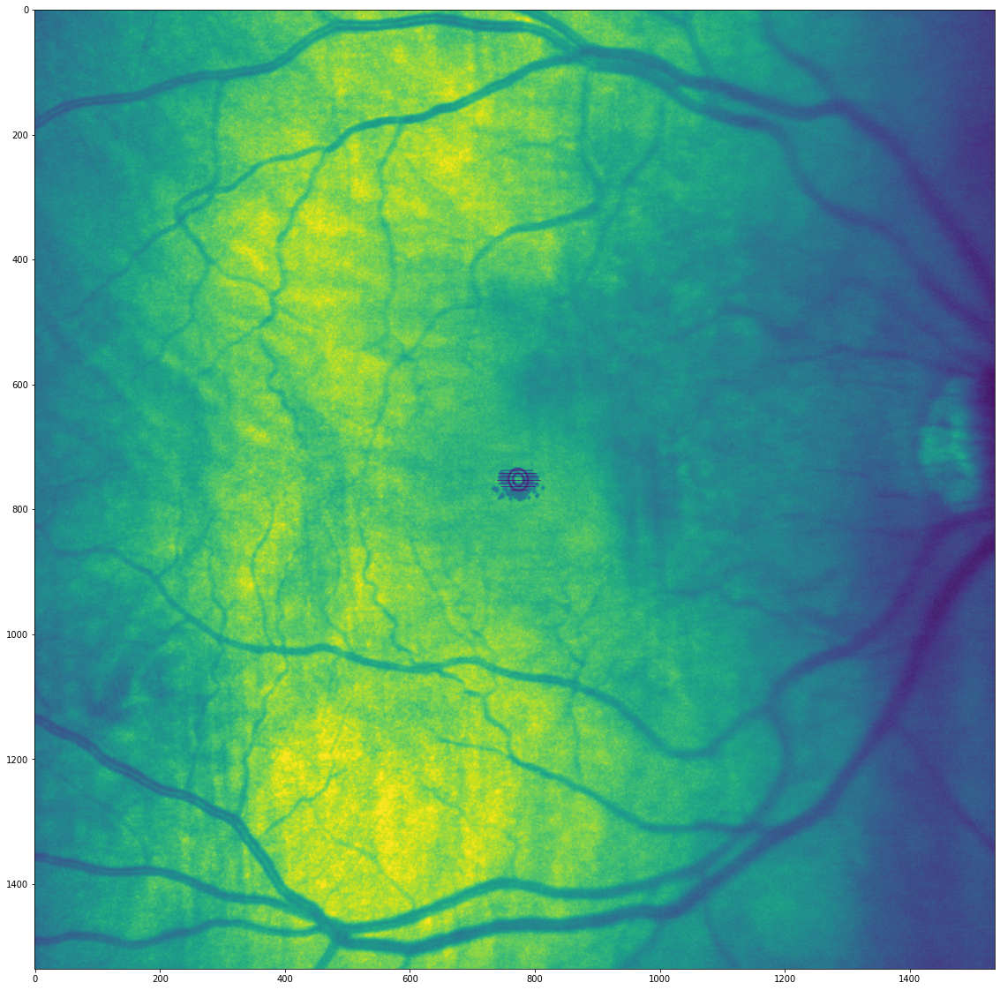

In [34]:
plt.figure(figsize=(20,20))
plt.imshow(overlaid)
plt.show()

## Check final step of creating preprocessed OCT scans

In [35]:
import numpy as np
import dataset, preprocessing
import os

In [36]:
root_config = 'C:\\Users\\line\\Desktop\\Mauro\\2_Preprocessing_Code\\config'
dataset_config = os.path.join(root_config, 'dataset.txt')
output_config = os.path.join(root_config, 'output.txt')
parameters_config = os.path.join(root_config, 'parameters.txt')

_ = dataset.initialize(dataset_config)
output_folders = preprocessing.parse_config_file(output_config)
parameters = preprocessing.parse_config_file(parameters_config)

In [37]:
identifiers = preprocessing.all_eye_identifiers()
# identifiers = [preprocessing.EyeIdentifier('control', 6, 'right')]

In [38]:
def count_n_intersecting(segmentations):
    layers = list(segmentations.keys())
    intersections = np.zeros_like(segmentations[layers[0]])
    for upper, lower in zip(layers[:-1], layers[1:]):
        upper_seg = segmentations[upper]
        lower_seg = segmentations[lower]
        layer_intersection = np.logical_and(upper_seg, lower_seg)
        intersections = np.logical_or(intersections, layer_intersection)
    return np.count_nonzero(intersections)

In [39]:
meta_folder = parameters['meta']
filename_to_meta_mapping = preprocessing.load_filename_to_meta_mapping(parameters['mapping'])

for identifier in identifiers:
    labelled_octs = preprocessing.load_pickle(output_folders['labelled_octs'], identifier)
    preprocessed_oct_scans = []
    
    if labelled_octs is None:
        continue
    
    for labelled_oct in labelled_octs:
        labelled_oct_path = preprocessing.relative_oct_scan_filepath(labelled_oct.oct_scan.filename)
        meta_file_names = filename_to_meta_mapping.get(labelled_oct_path, [])
        meta_file_path = preprocessing.find_meta_file_path(meta_folder, meta_file_names)
        
        if meta_file_path is not None:
            layer_values = segmentation.correct_overlapping_layer_values(
                segmentation.parse_meta_file(
                    meta_file_path,
                    segmentation.RETINAL_LAYERS
                ),
                segmentation.RETINAL_LAYERS
            )

            z_scored_oct_scan = dataset.z_score(labelled_oct.oct_scan.image())
            computed_retinal_flattening = segmentation.compute_retinal_flattening(layer_values)

            flattened_oct_image = segmentation.apply_retinal_flattening(
                z_scored_oct_scan, computed_retinal_flattening
            )
            segmentations = segmentation.compute_retinal_segmentation(
                z_scored_oct_scan, layer_values, segmentation.RETINAL_LAYERS
            )

            labelled_segmentation = segmentation.merge_segmentations_into_labelled_image(
                segmentations, z_scored_oct_scan.shape
            )
            flattened_labelled_segmentation = segmentation.apply_retinal_flattening(
                labelled_segmentation, computed_retinal_flattening
            )
            plt.imshow(flattened_labelled_segmentation)
            plt.show()
            thickness = segmentation.compute_retinal_thickness(
                layer_values, segmentation.RETINAL_LAYERS, total=True
            )

            preprocessed_oct_scans.append(PreprocessedOCTScan(
                identifier, labelled_oct, flattened_oct_image, flattened_labelled_segmentation, thickness
            ))

In [40]:
# control, 9, left, first slice has not corrected segmentations unlabelled
identifier = preprocessing.EyeIdentifier('control', 11, 'right')
preprocessed_octs = preprocessing.load_pickle(output_folders['preprocessed_octs'], identifier)
print(len(preprocessed_octs))

7


In [41]:
po = preprocessed_octs[1]
print(po.image().shape)
print(po.labelled_segmentation().shape)
print(po.thickness('INFL', 'ONFL').shape)
print(po.label().shape)

(86, 72)
(86, 768)
(72,)
(72,)


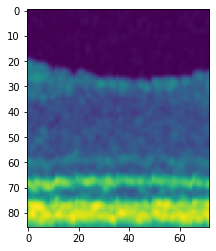

In [42]:
plt.imshow(po.image())
plt.show()

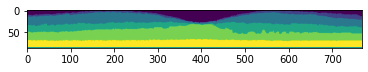

In [43]:
plt.imshow(po.labelled_segmentation())
plt.show()

In [44]:
ls = po.labelled_segmentation()
# ls[len(ls)-1] == 0 (background label) due to treating of outer layer boundary as exclusive
# (part of the layer below, if it exists)

## Check where are the missing meta files

In [45]:
import numpy as np

In [46]:
locations_amd = [
    r'C:\Users\line\Desktop\Mauro\1_Segmented_OCTs\_backup\_backup_AMD_segmentation_made_by_astrid\amd from Bene',
    r'C:\Users\line\Desktop\Mauro\1_Segmented_OCTs\_backup\_backup_AMD_segmentation_made_by_astrid\amd from astrid',
    r'C:\Users\line\Desktop\Mauro\1_Segmented_OCTs\_OCTs_Discarded_to_avoid_overlap_segmented_NOT_CHECKED\amd',
    r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\scans_for_segmentation\Astrid\amd',
    r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\scans_for_segmentation\Benedetta\amd',
    r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\scans_for_segmentation\me\amd'
    
]
locations_control = [
    r'C:\Users\line\Desktop\Mauro\1_Segmented_OCTs\_OCTs_Discarded_to_avoid_overlap_segmented_NOT_CHECKED\control',
    r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\scans_for_segmentation\Astrid\control',
    r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\scans_for_segmentation\Benedetta\control',
    r'C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\scans_for_segmentation\me\control'
    
]

In [47]:
nonexistent_meta_files

[('control/spectralis/oct/brd_left_center/FA766160.tif', ['control/240.meta']),
 ('amd/spectralis/oct/wim_left_up/2F176E00.tif',
  ['amd/610.meta', 'amd/187_v2.meta']),
 ('amd/spectralis/oct/wim_left_up/2FBB0100.tif',
  ['amd/620.meta', 'amd/194_v2.meta']),
 ('amd/spectralis/oct/wim_left_up/2FCB2DA0.tif',
  ['amd/621.meta', 'amd/195_v2.meta']),
 ('amd/spectralis/oct/wim_left_up/2FDD7D20.tif',
  ['amd/622.meta', 'amd/196_v2.meta']),
 ('amd/spectralis/oct/wim_left_up/2FED5BA0.tif',
  ['amd/623.meta', 'amd/197_v2.meta']),
 ('amd/spectralis/oct/wim_left_up/2FFF0EE0.tif',
  ['amd/624.meta', 'amd/198_v2.meta']),
 ('amd/spectralis/oct/wim_left_up/30A42880.tif',
  ['amd/634.meta', 'amd/205_v2.meta']),
 ('control/spectralis/oct/bas_right_up/20156810.tif',
  ['control/12.meta', 'control/261_v2.meta']),
 ('control/spectralis/oct/sif_right_center/B8F64640.tif',
  ['control/666.meta'])]

In [56]:
where = {}
not_found = []
for file in np.asarray(nonexistent_meta_files).flatten():
    group, filename = file.split('/')
    if group == 'amd':
        locations = locations_amd
    else:
        locations = locations_control
    
    found = False
    for location in locations:
        if os.path.exists(os.path.join(location, filename)):
            found = True
            if location in where:
                where[location].append(filename)
            else:
                where[location] = [filename]
    if not found:
        not_found.append(file)

AttributeError: 'list' object has no attribute 'split'

In [66]:
np.asarray(nonexistent_meta_files).flatten()

array(['control/spectralis/oct/brd_left_center/FA766160.tif',
       list(['control/240.meta']),
       'amd/spectralis/oct/wim_left_up/2F176E00.tif',
       list(['amd/610.meta', 'amd/187_v2.meta']),
       'amd/spectralis/oct/wim_left_up/2FBB0100.tif',
       list(['amd/620.meta', 'amd/194_v2.meta']),
       'amd/spectralis/oct/wim_left_up/2FCB2DA0.tif',
       list(['amd/621.meta', 'amd/195_v2.meta']),
       'amd/spectralis/oct/wim_left_up/2FDD7D20.tif',
       list(['amd/622.meta', 'amd/196_v2.meta']),
       'amd/spectralis/oct/wim_left_up/2FED5BA0.tif',
       list(['amd/623.meta', 'amd/197_v2.meta']),
       'amd/spectralis/oct/wim_left_up/2FFF0EE0.tif',
       list(['amd/624.meta', 'amd/198_v2.meta']),
       'amd/spectralis/oct/wim_left_up/30A42880.tif',
       list(['amd/634.meta', 'amd/205_v2.meta']),
       'control/spectralis/oct/bas_right_up/20156810.tif',
       list(['control/12.meta', 'control/261_v2.meta']),
       'control/spectralis/oct/sif_right_center/B8F64640.ti

In [48]:
not_found_filenames = {}
for path, metas in filename_to_meta_mapping.items():
    for meta in metas:
        if meta in not_found:
            not_found_filenames[meta] = path

In [62]:
with open('/home/ja8818/data/missing_segmentation.pickle', 'wb') as file:
    pickle.dump(missing_mappings + list(not_found_filenames.values()), file)

In [66]:
with open('/home/ja8818/data/missing_segmentation_but_having_mapping.pickle', 'wb') as file:
    pickle.dump(not_found_filenames, file)

In [64]:
with open('/home/ja8818/data/not_corrected_meta_files.pickle', 'wb') as file:
    pickle.dump(where, file)

## Filename mappings

In [21]:
import pickle
import os

In [22]:
mappings_folder = '/chuvdatarc/ja8818/RAD/LINE/Benedetta_Franceschiello/5_OCTs_Jakub_Gwizdala/0_backup_folder_development/AMD/scans_for_segmentation'

In [23]:
mappings_1_path = os.path.join(mappings_folder, 'filename_mappings.pickle')
mappings_2_path = os.path.join(mappings_folder, 'filename_mappings_v2.pickle')
with open(mappings_1_path, 'rb') as file:
    mappings_1 = pickle.load(file)
with open(mappings_2_path, 'rb') as file:
    mappings_2 = pickle.load(file)

In [24]:
len_prefix = len('/media/bzdeco/WD_LINE/AMD/raw_dataset/')

In [25]:
new_mappings = {}
for key, value in mappings_1.items():
    path = value.filename[len_prefix:]
    meta_file = f'{key[0]}/{key[1]}.meta'
    if path in new_mappings:
        new_mappings[path].append(meta_file)
    else:
        new_mappings[path] = [meta_file]

In [26]:
for key, value in mappings_2.items():
    path = value.oct_scan.filename[len_prefix:]
    meta_file = f'{value.group}/{key}.meta'
    if path in new_mappings:
        new_mappings[path].append(meta_file)
    else:
        new_mappings[path] = [meta_file]

In [27]:
n_multiple_names = 0
for value in new_mappings.values():
    if len(value) > 1:
        n_multiple_names += 1
print(n_multiple_names)

348


In [28]:
with open('/home/ja8818/data/filename_to_meta_mapping_extended.pickle', 'wb') as file:
    pickle.dump(new_mappings, file)

## v1 to v2

In [31]:
new_mappings

{'control/spectralis/oct/bas_right_up/1F32A930.tif': ['control/0.meta'],
 'control/spectralis/oct/bas_right_up/1F439920.tif': ['control/1.meta'],
 'control/spectralis/oct/bas_right_up/1F543AF0.tif': ['control/2.meta',
  'control/257_v2.meta'],
 'control/spectralis/oct/bas_right_up/1F674DC0.tif': ['control/3.meta'],
 'control/spectralis/oct/bas_right_up/1F7F1B80.tif': ['control/4.meta'],
 'control/spectralis/oct/bas_right_up/1F949F50.tif': ['control/5.meta',
  'control/258_v2.meta'],
 'control/spectralis/oct/bas_right_up/1FAA2320.tif': ['control/6.meta'],
 'control/spectralis/oct/bas_right_up/1FBD35F0.tif': ['control/7.meta'],
 'control/spectralis/oct/bas_right_up/1FCDD7C0.tif': ['control/8.meta',
  'control/259_v2.meta'],
 'control/spectralis/oct/bas_right_up/1FE0EA90.tif': ['control/9.meta'],
 'control/spectralis/oct/bas_right_up/1FF1B370.tif': ['control/10.meta'],
 'control/spectralis/oct/bas_right_up/20025540.tif': ['control/11.meta',
  'control/260_v2.meta'],
 'control/spectralis/o